### Part 3: Object Detection (50 Points)

#### 1. Explain what is Mask R–CNN (5 points)

Mask R-CNN is the extenstion of faster R-CNN which adds the branch for prdicting segmentation masks on each Region of Interest. This is in parallel with an existing branch for classification and bounding boxes regression.
###### Mask R-CNN has three outputs
1. For each candidate object, a class label
2. A bounding-box offset;
3. Third output is the object mask
###### Mask R-CNN model is divided into two parts
1. Region proposal network (RPN) to proposes candidate object bounding boxes.
2. Binary mask classifier to generate mask for every class

Ref: https://towardsdatascience.com/computer-vision-instance-segmentation-with-mask-r-cnn-7983502fcad1

#### 2. Explain U-Net (5 points)

#### U-Net is a convolutional networ archtecture used for fast and precise segmentation of images that was developed for biomedical image segmentation.

The U-Net Architecture is in the shape of "U" and it consists of multi-channel feature map. The feature from the left side is copied to the right side and they represented as "copied feature maps". 


#### 3. What is intersection over union (2 points)

#### The intersection of two sets divided by their union. In machine-learning image-detection tasks, IoU is used to measure the accuracy of the model’s predicted

IoU computes intersection over the union of the two bounding boxes, the bounding box for the ground truth and the bounding box for the predicted box by algorithm.
When IoU is 1 that would imply that predicted and the ground-truth bounding boxes overlap perfectly.
To detect an Object once in an image, Non-Max suppression considers all bounding boxes with IoU >0.5

Ref: https://towardsdatascience.com/computer-vision-instance-segmentation-with-mask-r-cnn-7983502fcad1

#### 4. Download the images from the attached folders “train images” and “test images”. (There are 161,747 training images)

#### Ref: https://notebooks.githubusercontent.com/view/ipynb?azure_maps_enabled=false&browser=unknown_browser&color_mode=auto&commit=cca3b3d269a65aed511fca0131ab9b0b8ce181ab&device=unknown_device&enc_url=68747470733a2f2f7261772e67697468756275736572636f6e74656e742e636f6d2f6177732d73616d706c65732f616d617a6f6e2d736167656d616b65722d617263686974656374696e672d666f722d6d6c2f636361336233643236396136356165643531316663613031333161623962306238636531383161622f537461727465722d436f64652f2e6970796e625f636865636b706f696e74732f736869702d646174612d7472616e73666f726d6174696f6e2d636865636b706f696e742e6970796e62&enterprise_enabled=false&logged_in=false&nwo=aws-samples%2Famazon-sagemaker-architecting-for-ml&path=Starter-Code%2F.ipynb_checkpoints%2Fship-data-transformation-checkpoint.ipynb&platform=unknown_platform&repository_id=162635108&repository_type=Repository&version=0

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage 
from skimage import io

import os
from skimage import io
from skimage.io import imread
from skimage.morphology import label
import pandas as pd
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
import random
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

input_dir = 'airbus-ship-detection/'
train_img_dir = 'airbus-ship-detection/train_v2/'
test_img_dir = 'airbus-ship-detection/test_v2/'

#### 5. Download the ‘train_df.csv’ (it contains the image id and the corresponding pixels where ship is present (NaN when there is no ship)).

In [ ]:
train_ship_segmentations_v2 = pd.read_csv("airbus-ship-detection/train_ship_segmentations_v2.csv")
train_ship_segmentations_v2.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


In [ ]:
def rle_decode(mask_rle,shape = (768,768)):
    s = mask_rle.split()
#    print("s:",s)
#    print(len(s))
#    print()
    starts, lengths = [np.asarray(x, dtype = int) for x in (s[0:][::2],s[1:][::2])]
#    print("starts:", starts)
#    print(len(starts))
#    print()
#    print("lengths:",lengths)
#    print(len(lengths))
#    print()
    starts -=1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype = np.uint8)
    for lo, hi in zip(starts,ends): img[lo:hi] = 1
    return img.reshape(shape).T

In [ ]:
temp = '264661 17 265429 33 266197 33 266965 33 267733 33 268501 33 269269 33 270037 33 270805 33 271573 33 272341 33 273109 33 273877 33 274645 33 275413 33 276181 33 276949 33 277716 34 278484 34 279252 33 280020 33 280788 33 281556 33 282324 33 283092 33 283860 33 284628 33 285396 33 286164 33 286932 33 287700 33 288468 33 289236 33 290004 33 290772 33 291540 33 292308 33 293076 33 293844 33 294612 33 295380 33 296148 33 296916 33 297684 33 298452 33 299220 33 299988 33 300756 33 301524 33 302292 33 303060 33 303827 34 304595 34 305363 33 306131 33 306899 33 307667 33 308435 33 309203 33 309971 33 310739 33 311507 33 312275 33 313043 33 313811 33 314579 33 315347 33 316115 33 316883 33 317651 33 318419 33 319187 33 319955 33 320723 33 321491 33 322259 33 323027 33 323795 33 324563 33 325331 33 326099 33 326867 33 327635 33 328403 33 329171 33 329938 34 330706 34 331474 33 332242 33 333010 33 333778 33 334546 33 335314 33 336082 33 336850 33 337618 33 338386 33 339154 33 339922 33 340690 33 341458 33 342226 33 343003 24 343787 8'
rle_decode(temp, shape = (768, 768))

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
import numpy as np
from PIL import Image

filepath = 'airbus-ship-detection/train_v2/09f4ffefd.jpg'

with Image.open(filepath) as img:
    shape = np.array(img).shape

ImageId = '09f4ffefd.jpg'


img = imread('airbus-ship-detection/train_v2/' + ImageId)
img_masks = train_ship_segmentations_v2.loc[train_ship_segmentations_v2['ImageId'] == ImageId, 'EncodedPixels'].tolist()
img_masks

['111198 2 111962 6 112726 11 113490 15 114254 19 115018 23 115782 28 116548 30 117316 30 118085 29 118853 30 119621 30 120389 28 121158 23 121926 19 122694 15 123462 11 124231 6 124999 2',
 '127230 1 127996 4 128762 6 129528 9 130294 11 131060 14 131827 15 132593 18 133359 21 134125 23 134891 26 135657 28 136424 30 137190 32 137956 35 138722 37 139488 40 140254 43 141021 44 141787 47 142553 49 143319 52 144085 54 144851 57 145618 57 146384 57 147150 57 147916 57 148682 57 149448 58 150215 57 150981 57 151747 57 152513 58 153279 58 154045 58 154812 57 155581 54 156349 53 157118 50 157886 48 158655 45 159423 43 160192 41 160960 39 161729 36 162497 34 163266 32 164034 30 164803 27 165572 24 166340 22 167109 20 167877 18 168646 15 169414 13 170183 11 170951 9 171720 6 172488 4 173257 1']

In [ ]:
def rle_decode(mask_rle,shape = (768,768)):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype = int) for x in (s[0:][::2],s[1:][::2])]
#   print("s:",s)
#    print(len(s))
#    print()
#    print("starts:", starts)
#    print(len(starts))
#    print()
#    print("lengths:",lengths)
#    print(len(lengths))
#    print()"""

    starts -=1
    ends = starts + lengths
#   print("ends:",ends)
    img = np.zeros(shape[0]*shape[1], dtype = np.uint8)
    for lo, hi in zip(starts,ends): img[lo:hi] = 1
    return img.reshape(shape).T

In [ ]:
all_masks = np.zeros((768,768))
for mask in img_masks: all_masks += rle_decode(mask)


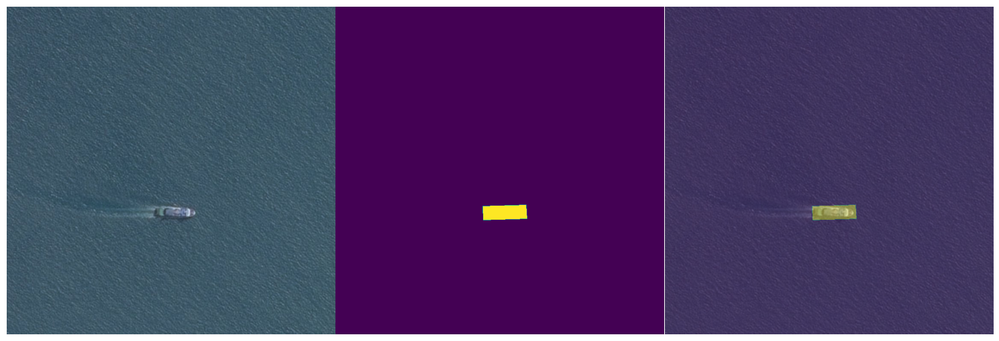

In [ ]:
#ImageId = '0a3b48a9c.jpg'
ImageId = '000155de5.jpg'


img = imread('airbus-ship-detection/train_v2/' + ImageId)
img_masks = train_ship_segmentations_v2.loc[train_ship_segmentations_v2['ImageId'] == ImageId, 'EncodedPixels'].tolist()

all_masks = np.zeros((768,768))
for mask in img_masks: all_masks += rle_decode(mask)
    
flg, axarr = plt.subplots(1,3, figsize = (15,40))
axarr[0].axis('off')
axarr[1].axis('off')
axarr[2].axis('off')
axarr[0].imshow(img)
axarr[1].imshow(all_masks)
axarr[2].imshow(img)
axarr[2].imshow(all_masks, alpha = 0.4)
plt.tight_layout(h_pad = 0.1, w_pad = 0.1)
plt.show()

In [ ]:

ship_dir = 'airbus-ship-detection/'
train_image_dir = 'train_v2'
test_image_dir = 'test_v2'

from skimage.morphology import label
def multi_rle_encode(img):
    labels = label(img[:, :, 0])
    return [rle_encode(labels==k) for k in np.unique(labels[labels>0])]

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def masks_as_image(in_mask_list, all_masks=None):
    # Take the individual ship masks and create a single mask array for all ships
    if all_masks is None:
        all_masks = np.zeros((768, 768))
    #if isinstance(in_mask_list, list):
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask)
    return np.expand_dims(all_masks, -1)

In [ ]:
masks = pd.read_csv('airbus-ship-detection/train_ship_segmentations_v2.csv')
print(masks.shape[0], 'masks found')
print(masks['ImageId'].value_counts().shape[0])
masks.head()

231723 masks found
192556


,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [ ]:
images_with_ship = masks.ImageId[masks.EncodedPixels.isnull()==False]
images_with_ship = np.unique(images_with_ship.values)
print('There are ' +str(len(images_with_ship)) + ' image files with masks')

There are 42556 image files with masks


In [ ]:
images_without_ship = masks.ImageId[masks.EncodedPixels.isnull()==True]
images_without_ship = np.unique(images_without_ship.values)
print('There are ' +str(len(images_without_ship)) + ' image files without masks')

There are 150000 image files without masks


In [ ]:
import cv2
import io
import boto3
from PIL import Image
import matplotlib.image as mpimg

#### 6. Plot some of the random images from train set having 0, 1 and 2 ships (can figure out from the train_df.csv file) (1 points)

0 Ships

In [ ]:
%matplotlib inline

plt.figure(figsize=(10, 10))
for i in range(9):
    image = images_without_ship[i]
    filepath = ship_dir + '/' + train_image_dir + '/' + image
    img_0 = skimage.io.imread (filepath)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img_0)
    plt.title(images_with_ship[i])
    plt.axis("off")

1 or 2 Ships

In [ ]:
%matplotlib inline

plt.figure(figsize=(10, 10))
for i in range(9):
    image = images_with_ship[i]
    filepath = ship_dir + '/' + train_image_dir + '/' + image
    img_0 = skimage.io.imread (filepath)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img_0)
    plt.title(images_with_ship[i])
    plt.axis("off")

#### 7. Highlight the area having ship in the above images (using the pixel information from the train_df.csv) (5 points)

Image 000155de5.jpg
Found bbox (465, 344, 0, 501, 448, 1)


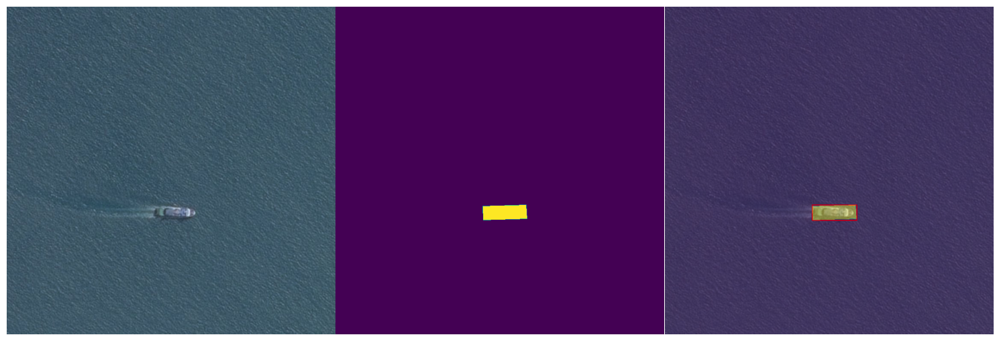

Image 000194a2d.jpg
Found bbox (377, 67, 0, 387, 85, 1)
Found bbox (174, 258, 0, 185, 306, 1)
Found bbox (178, 331, 0, 197, 370, 1)
Found bbox (287, 469, 0, 307, 492, 1)


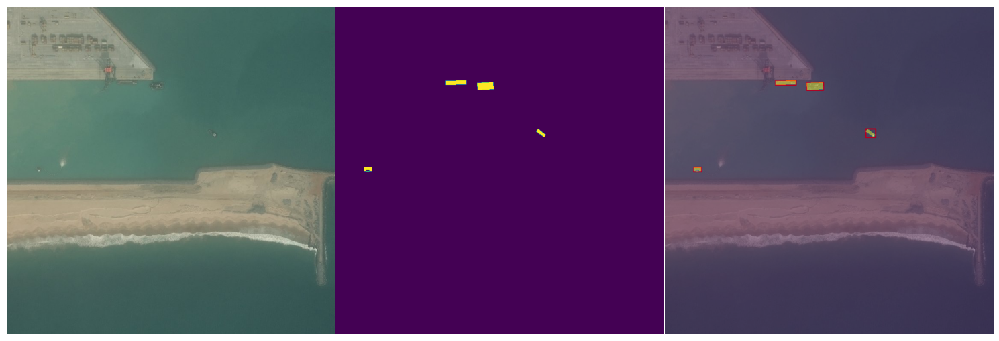

Image 00021ddc3.jpg
Found bbox (705, 96, 0, 720, 121, 1)
Found bbox (732, 123, 0, 768, 178, 1)
Found bbox (629, 181, 0, 638, 187, 1)
Found bbox (661, 195, 0, 665, 201, 1)


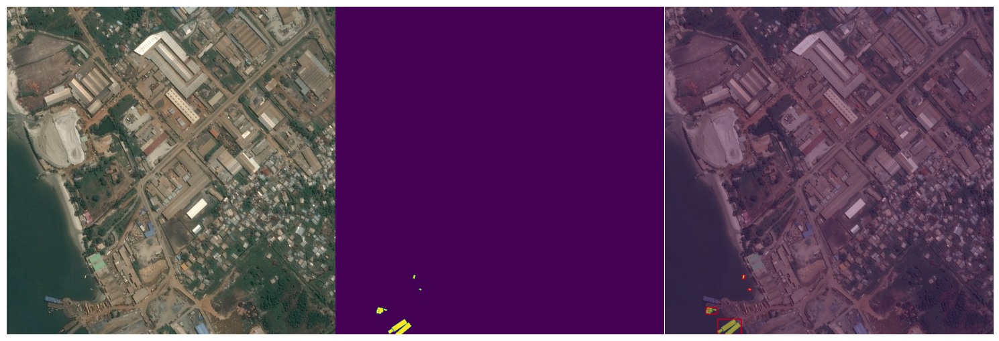

Image 0002756f7.jpg
Found bbox (36, 324, 0, 67, 351, 1)


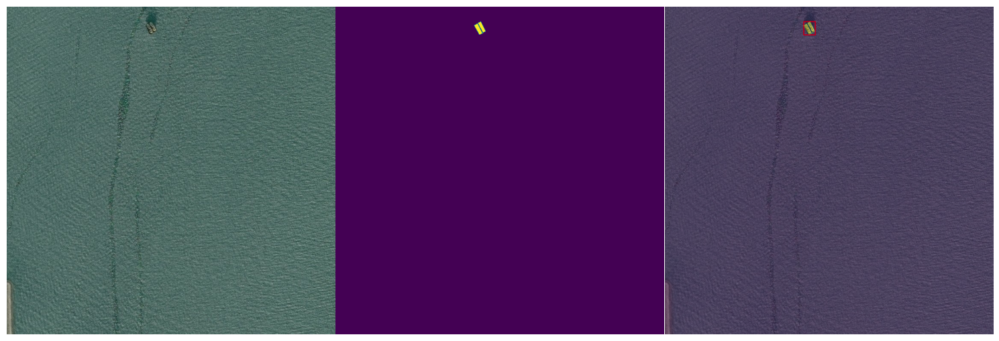

Image 00031f145.jpg
Found bbox (124, 443, 0, 153, 472, 1)


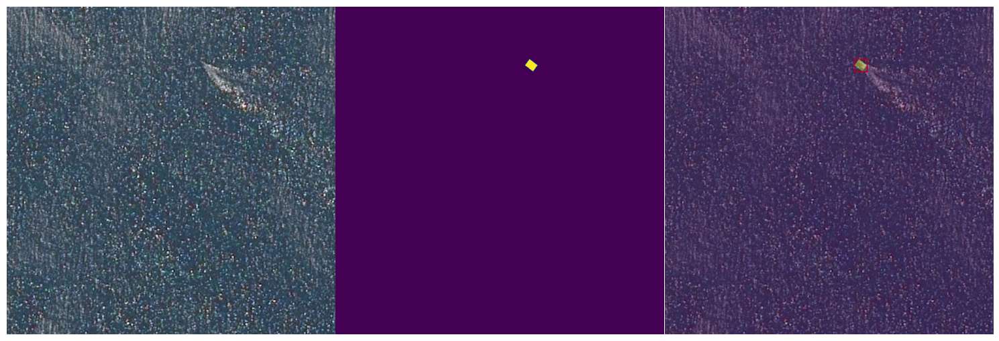

Image 000532683.jpg
Found bbox (460, 597, 0, 474, 604, 1)
Found bbox (756, 738, 0, 763, 747, 1)


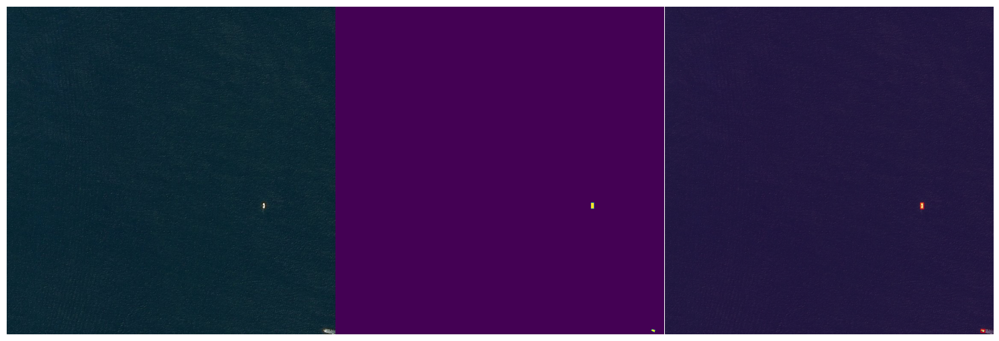

Image 00053c6ba.jpg
Found bbox (124, 736, 0, 139, 752, 1)


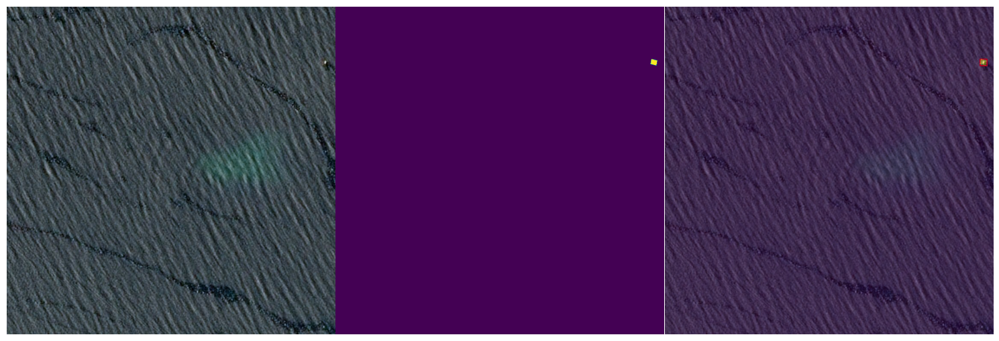

Image 0005d01c8.jpg
Found bbox (598, 72, 0, 739, 237, 1)
Found bbox (252, 476, 0, 321, 556, 1)


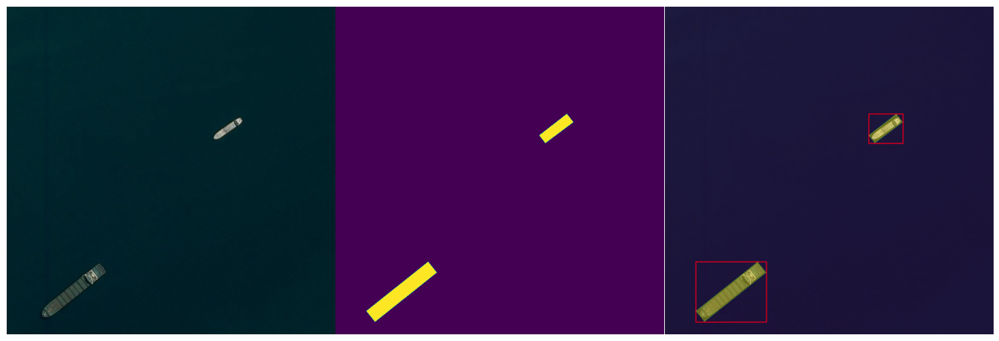

Image 0005d6d95.jpg
Found bbox (171, 345, 0, 190, 367, 1)


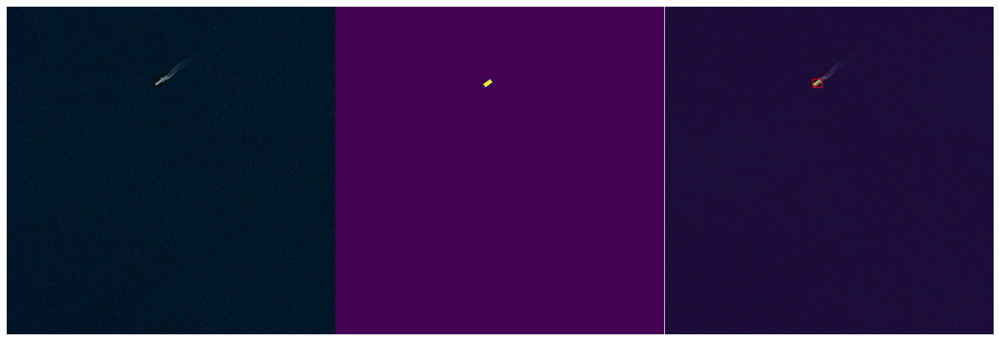

Image 0006c52e8.jpg
Found bbox (197, 190, 0, 472, 407, 1)


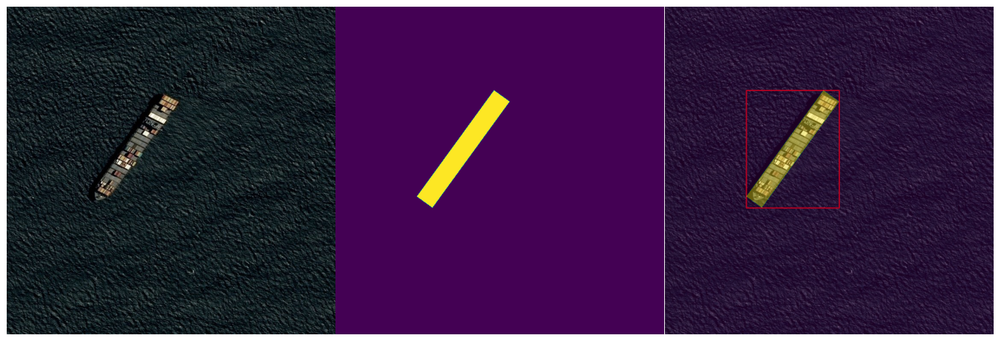

In [ ]:
for i in range(10):
    image = images_with_ship[i]
    
    flg, axarr = plt.subplots(1,3, figsize = (15,40))
    filepath = ship_dir + '/' + train_image_dir + '/' + image
    
    img_0 = skimage.io.imread (filepath)
    rle_0 = masks.query('ImageId=="'+image+'"')['EncodedPixels']
    mask_0 = masks_as_image(rle_0)
    #
    # 
    lbl_0 = skimage.measure.label(mask_0) 
    props = skimage.measure.regionprops(lbl_0)
    img_1 = img_0.copy()
    print ('Image', image)
    for prop in props:
        print('Found bbox', prop.bbox)
        cv2.rectangle(img_1, (prop.bbox[1], prop.bbox[0]), (prop.bbox[4], prop.bbox[3]), (255, 0, 0), 2)

    
    axarr[0].axis('off')
    axarr[1].axis('off')
    axarr[2].axis('off')
    axarr[0].imshow(img_0)
    axarr[1].imshow(mask_0)
    axarr[2].imshow(img_1)
    axarr[2].imshow(mask_0, alpha = 0.4)
    plt.tight_layout(h_pad = 0.1, w_pad = 0.1)
    plt.show()

#### 8. Plot some of the random test set images (2 points)

In [ ]:
import os
plt.figure(figsize=(10, 10))
filefolder = ship_dir + '/' + test_image_dir
i = 0
for file_ in os.listdir(filefolder):
    filepath = ship_dir + '/' + test_image_dir + '/' + file_
    img_0 = skimage.io.imread (filepath)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img_0)
    plt.title(images_with_ship[i])
    plt.axis("off")
    i +=1
    if i == 9:
        break

#### 9. Perform object detection and submit your results in the format of sample_submission.csv file. (30 points)

In [ ]:

import gc 
from tqdm import tqdm

bboxes_dict = {}
i = 0
count_ships = 0
for image in tqdm(images_with_ship):
    rle_0 = masks.query('ImageId=="'+image+'"')['EncodedPixels']
    mask_0 = masks_as_image(rle_0)
    

    #
    # 
    lbl_0 = skimage.measure.label(mask_0) 
    props = skimage.measure.regionprops(lbl_0)
    bboxes = []
    count_ships = count_ships + len(props)
    for prop in props:
        bboxes.append(prop.bbox)
        
        
    i = i + 1
    if i % 500 == 0:
        gc.collect()    

    bboxes_dict[image] = bboxes.copy()

100%|████████████████████████████████████| 42556/42556 [06:30<00:00, 109.02it/s]


In [ ]:
dict_images = list(bboxes_dict.keys())
for i in range(5):
    image = dict_images[10+i]
    print(image)
    flg, axarr = plt.subplots(1,3, figsize = (15,40))
    filepath = ship_dir + '/' + train_image_dir + '/' + image
    
    img_0 = skimage.io.imread (filepath)
    rle_0 = masks.query('ImageId=="'+image+'"')['EncodedPixels']
    mask_0 = masks_as_image(rle_0)
    img_1 = img_0.copy()
    bboxs = bboxes_dict[image]
    for bbox in bboxs:
        cv2.rectangle(img_1, (bbox[1], bbox[0]), (bbox[4], bbox[3]), (255, 0, 0), 2)

    axarr[0].axis('off')
    axarr[1].axis('off')
    axarr[2].axis('off')
    axarr[0].imshow(img_0)
    axarr[1].imshow(mask_0)
    axarr[2].imshow(img_1)
    axarr[2].imshow(mask_0, alpha = 0.4)
    plt.tight_layout(h_pad = 0.1, w_pad = 0.1)
    plt.show()

In [ ]:
bboxes_df = pd.DataFrame([bboxes_dict])
bboxes_df = bboxes_df.transpose()
bboxes_df.columns = ['bbox_list']
bboxes_df.head()

,bbox_list
000155de5.jpg,"[(465, 344, 0, 501, 448, 1)]"
000194a2d.jpg,"[(377, 67, 0, 387, 85, 1), (174, 258, 0, 185, ..."
00021ddc3.jpg,"[(705, 96, 0, 720, 121, 1), (732, 123, 0, 768,..."
0002756f7.jpg,"[(36, 324, 0, 67, 351, 1)]"
00031f145.jpg,"[(124, 443, 0, 153, 472, 1)]"


In [ ]:
bboxes_df.to_json('bbox_dictionary2.json')

In [ ]:
#image= '0a0df8299.jpg'
image = '000532683.jpg'
filepath = ship_dir + '/' + train_image_dir + '/' + image
    
img_0 = skimage.io.imread (filepath)
img_1 = rle_encode(img_0)


### Model building

In [ ]:
def area_isnull(x):
    if x == x:
        return 0
    else:
        return 1

In [ ]:
train_df = pd.read_csv(input_dir+'train_ship_segmentations_v2.csv')

In [ ]:
train_df['isnan'] = train_df['EncodedPixels'].apply(area_isnull)

In [ ]:
train_df['isnan'].value_counts()

1    150000
0     81723
Name: isnan, dtype: int64

In [ ]:
train_df = train_df.sort_values('isnan', ascending=False)

In [ ]:
train_df['isnan'].value_counts()

1    150000
0     81723
Name: isnan, dtype: int64

In [ ]:
def rle_to_mask(rle_list, SHAPE):
    tmp_flat = np.zeros(SHAPE[0]*SHAPE[1])
    if len(rle_list) == 1:
        mask = np.reshape(tmp_flat, SHAPE).T
    else:
        strt = rle_list[::2]
        length = rle_list[1::2]
        for i,v in zip(strt,length):
            tmp_flat[(int(i)-1):(int(i)-1)+int(v)] = 255
        mask = np.reshape(tmp_flat, SHAPE).T
    return mask

In [ ]:
def calc_area_for_rle(rle_str):
    rle_list = [int(x) if x.isdigit() else x for x in str(rle_str).split()]
    if len(rle_list) == 1:
        return 0
    else:
        area = np.sum(rle_list[1::2])
        return area

In [ ]:
train_df['area'] = train_df['EncodedPixels'].apply(calc_area_for_rle)

In [ ]:
train_df_isship = train_df[train_df['area'] > 0]

In [ ]:
train_df_isship.shape

(81723, 4)

In [ ]:
train_df_smallarea = train_df_isship['area'][train_df_isship['area'] < 10]

In [ ]:
train_df_smallarea.shape

(101,)

In [ ]:
train_df_smallarea.shape[0]/train_df_isship.shape[0]

0.001235882187389107

In [ ]:
train_gp = train_df.groupby('ImageId').sum()
train_gp = train_gp.reset_index()

In [ ]:
train_gp.head()

,ImageId,isnan,area
0,00003e153.jpg,1,0
1,0001124c7.jpg,1,0
2,000155de5.jpg,0,3388
3,000194a2d.jpg,0,1460
4,0001b1832.jpg,1,0


In [ ]:
def calc_class(area):
    area = area / (768*768)
    if area == 0:
        return 0
    elif area < 0.005:
        return 1
    elif area < 0.015:
        return 2
    elif area < 0.025:
        return 3
    elif area < 0.035:
        return 4
    elif area < 0.045:
        return 5
    else:
        return 6

In [ ]:
train_gp['class'] = train_gp['area'].apply(calc_class)

In [ ]:
train_gp['class'].value_counts()

0    150000
1     29315
2      9225
3      2644
4      1122
5       181
6        69
Name: class, dtype: int64

In [ ]:
train, val = train_test_split(train_gp, test_size=0.1, stratify=train_gp['class'].tolist())

In [ ]:
train_isship_list = train['ImageId'][train['isnan']==0].tolist()
train_isship_list = random.sample(train_isship_list, len(train_isship_list))
train_nanship_list = train['ImageId'][train['isnan']==1].tolist()
train_nanship_list = random.sample(train_nanship_list, len(train_nanship_list))

In [ ]:
len(train_isship_list),len(train_nanship_list)

(38300, 135000)

###### Ref: https://www.kaggle.com/code/abimannan/airship-deep-detection

In [ ]:
def mygenerator(isship_list, nanship_list, batch_size, cap_num):
    train_img_names_nanship = isship_list[:cap_num]
    train_img_names_isship = nanship_list[:cap_num]
    k = 0
    while True:
        if k+batch_size//2 >= cap_num:
            k = 0
        batch_img_names_nan = train_img_names_nanship[k:k+batch_size//2]
        batch_img_names_is = train_img_names_isship[k:k+batch_size//2]
        batch_img = []
        batch_mask = []
        for name in batch_img_names_nan:
            tmp_img = imread(train_img_dir + name)
            batch_img.append(tmp_img)
            mask_list = train_df['EncodedPixels'][train_df['ImageId'] == name].tolist()
            one_mask = np.zeros((768, 768, 1))
            for item in mask_list:
                rle_list = str(item).split()
                tmp_mask = rle_to_mask(rle_list, (768, 768))
                one_mask[:,:,0] += tmp_mask
            batch_mask.append(one_mask)
        for name in batch_img_names_is:
            tmp_img = imread(train_img_dir + name)
            batch_img.append(tmp_img)
            mask_list = train_df['EncodedPixels'][train_df['ImageId'] == name].tolist()
            one_mask = np.zeros((768, 768, 1))
            for item in mask_list:
                rle_list = str(item).split()
                tmp_mask = rle_to_mask(rle_list, (768, 768))
                one_mask[:,:,0] += tmp_mask
            batch_mask.append(one_mask)
        img = np.stack(batch_img, axis=0)
        mask = np.stack(batch_mask, axis=0)
        img = img / 255.0
        mask = mask / 255.0
        k += batch_size//2
        yield img, mask

In [ ]:
BATCH_SIZE = 2
CAP_NUM = min(len(train_isship_list),len(train_nanship_list))
datagen = mygenerator(train_isship_list, train_nanship_list, batch_size=BATCH_SIZE, cap_num=CAP_NUM)

In [ ]:
inputs = Input(shape=(768,768,3))
conv0 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
conv0 = BatchNormalization()(conv0)
conv0 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv0)
conv0 = BatchNormalization()(conv0)

comp0 = AveragePooling2D((6,6))(conv0)
conv1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(comp0)
conv1 = BatchNormalization()(conv1)
conv1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
conv1 = BatchNormalization()(conv1)
conv1 = Dropout(0.0)(conv1)

pool1 = MaxPooling2D(pool_size=(2,2))(conv1)
conv2 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
conv2 = BatchNormalization()(conv2)
conv2 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
conv2 = BatchNormalization()(conv2)
conv2 = Dropout(0.0)(conv2)

pool2 = MaxPooling2D(pool_size=(2,2))(conv2)
conv3 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
conv3 = BatchNormalization()(conv3)
conv3 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
conv3 = BatchNormalization()(conv3)
conv3 = Dropout(0.0)(conv3)

pool3 = MaxPooling2D(pool_size=(2,2))(conv3)
conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
conv4 = BatchNormalization()(conv4)
conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
conv4 = BatchNormalization()(conv4)
conv4 = Dropout(0.0)(conv4)

pool4 = MaxPooling2D(pool_size=(2,2))(conv4)
conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
conv5 = BatchNormalization()(conv5)
conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
conv5 = BatchNormalization()(conv5)

upcv6 = UpSampling2D(size=(2,2))(conv5)
upcv6 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(upcv6)
upcv6 = BatchNormalization()(upcv6)
mrge6 = concatenate([conv4, upcv6], axis=3)
conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mrge6)
conv6 = BatchNormalization()(conv6)
conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
conv6 = BatchNormalization()(conv6)

upcv7 = UpSampling2D(size=(2,2))(conv6)
upcv7 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(upcv7)
upcv7 = BatchNormalization()(upcv7)
mrge7 = concatenate([conv3, upcv7], axis=3)
conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mrge7)
conv7 = BatchNormalization()(conv7)
conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
conv7 = BatchNormalization()(conv7)

upcv8 = UpSampling2D(size=(2,2))(conv7)
upcv8 = Conv2D(32, 2, activation='relu', padding='same', kernel_initializer='he_normal')(upcv8)
upcv8 = BatchNormalization()(upcv8)
mrge8 = concatenate([conv2, upcv8], axis=3)
conv8 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mrge8)
conv8 = BatchNormalization()(conv8)
conv8 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
conv8 = BatchNormalization()(conv8)

upcv9 = UpSampling2D(size=(2,2))(conv8)
upcv9 = Conv2D(16, 2, activation='relu', padding='same', kernel_initializer='he_normal')(upcv9)
upcv9 = BatchNormalization()(upcv9)
mrge9 = concatenate([conv1, upcv9], axis=3)
conv9 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mrge9)
conv9 = BatchNormalization()(conv9)
conv9 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
conv9 = BatchNormalization()(conv9)

dcmp10 = UpSampling2D((6,6), interpolation='bilinear')(conv9)
mrge10 = concatenate([dcmp10, conv0], axis=3)
conv10 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mrge10)
conv10 = BatchNormalization()(conv10)
conv10 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv10)
conv10 = BatchNormalization()(conv10)
conv11 = Conv2D(1, 1, activation='sigmoid')(conv10)

model = Model(inputs=inputs, outputs=conv11)


Metal device set to: Apple M1 Pro


2022-10-18 15:13:47.900590: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-10-18 15:13:47.900698: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 768, 768, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 768, 768, 8)  224         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 768, 768, 8)  32         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

 conv2d_11 (Conv2D)             (None, 8, 8, 256)    590080      ['batch_normalization_10[0][0]'] 
                                                                                                  
 batch_normalization_11 (BatchN  (None, 8, 8, 256)   1024        ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 up_sampling2d (UpSampling2D)   (None, 16, 16, 256)  0           ['batch_normalization_11[0][0]'] 
                                                                                                  
 conv2d_12 (Conv2D)             (None, 16, 16, 128)  131200      ['up_sampling2d[0][0]']          
                                                                                                  
 batch_normalization_12 (BatchN  (None, 16, 16, 128)  512        ['conv2d_12[0][0]']              
 ormalizat

 conv2d_23 (Conv2D)             (None, 128, 128, 16  2320        ['batch_normalization_22[0][0]'] 
                                )                                                                 
                                                                                                  
 batch_normalization_23 (BatchN  (None, 128, 128, 16  64         ['conv2d_23[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 up_sampling2d_4 (UpSampling2D)  (None, 768, 768, 16  0          ['batch_normalization_23[0][0]'] 
                                )                                                                 
                                                                                                  
 concatenate_4 (Concatenate)    (None, 768, 768, 24  0           ['up_sampling2d_4[0][0]',        
          

In [ ]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(datagen, steps_per_epoch = 200,epochs = 10)

Epoch 1/10


2022-10-18 15:13:48.500649: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-10-18 15:13:49.613716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


200/200 [==============================] - 60s 293ms/step - loss: 0.5207 - accuracy: 0.9065
Epoch 2/10
200/200 [==============================] - 59s 293ms/step - loss: 0.1886 - accuracy: 0.9974
Epoch 3/10
200/200 [==============================] - 58s 290ms/step - loss: 0.0664 - accuracy: 0.9975
Epoch 4/10
200/200 [==============================] - 58s 291ms/step - loss: 0.0337 - accuracy: 0.9976
Epoch 5/10
200/200 [==============================] - 58s 289ms/step - loss: 0.0205 - accuracy: 0.9981
Epoch 6/10
200/200 [==============================] - 58s 290ms/step - loss: 0.0150 - accuracy: 0.9980
Epoch 7/10
200/200 [==============================] - 58s 290ms/step - loss: 0.0127 - accuracy: 0.9980
Epoch 8/10
200/200 [==============================] - 58s 290ms/step - loss: 0.0121 - accuracy: 0.9979
Epoch 9/10
200/200 [==============================] - 58s 292ms/step - loss: 0.0095 - accuracy: 0.9980
Epoch 10/10
200/200 [==============================] - 59s 293ms/step - loss: 0.0085

In [ ]:
model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
def calc_IoU(A, B):
    AorB = np.logical_or(A,B).astype('int')
    AandB = np.logical_and(A,B).astype('int')
    IoU = AandB.sum() / AorB.sum()
    return IoU


In [ ]:
def calc_IoU_vector(A, B):
    score_vector = []
    IoU = calc_IoU(A, B)
    for threshold in np.arange(0.5,1,0.05):
        score = int(IoU > threshold)
        score_vector.append(score)
    return score_vector

In [ ]:
def calc_IoU_tensor(masks_true, masks_pred):
    true_mask_num = masks_true.shape[0]
    pred_mask_num = masks_pred.shape[0]
    score_tensor = np.zeros((true_mask_num, pred_mask_num, 10))
    for true_i in range(true_mask_num):
        for pred_i in range(pred_mask_num):
            true_mask = masks_true[true_i]
            pred_mask = masks_pred[pred_i]
            score_vector = calc_IoU_vector(true_mask, pred_mask)
            score_tensor[true_i,pred_i,:] = score_vector
    return score_tensor

In [ ]:
def calc_F2_per_one_threshold(score_matrix):
    tp = np.sum( score_matrix.sum(axis=1) > 0  )
    fp = np.sum( score_matrix.sum(axis=1) == 0 )
    fn = np.sum( score_matrix.sum(axis=0) == 0 )
    F2 = (5*tp) / ((5*tp) + fp + (4*fn))
    return F2

In [ ]:
def calc_score_one_image(mask_true, mask_pred):
    mask_true = mask_true.reshape(768,768)
    mask_pred = mask_pred.reshape(768,768)
    if mask_true.sum() == 0 and mask_pred.sum() == 0:
        score = 1
    elif mask_true.sum() == 0 and mask_pred.sum() != 0:
        score = 0
    elif mask_true.sum() != 0 and mask_pred.sum() == 0:
        score = 0
    else:
        mask_label_true = label(mask_true)
        mask_label_pred = label(mask_pred)
        c_true = np.max(mask_label_true)
        c_pred = np.max(mask_label_pred)
        tmp = []
        for k in range(c_true):
            tmp.append(mask_label_true == k+1)
        masks_true = np.stack(tmp, axis=0)
        tmp = []
        for k in range(c_pred):
            tmp.append(mask_label_pred == k+1)
        masks_pred = np.stack(tmp, axis=0)
        score_tensor = calc_IoU_tensor(masks_true, masks_pred)
        F2_t = []
        for i in range(10):
            F2 = calc_F2_per_one_threshold(score_tensor[:,:,i])
            F2_t.append(F2)
        score = np.mean(F2_t)
    return score

In [ ]:
def calc_score_all_image(batch_mask_true, batch_mask_pred, threshold=0.5):
    num = batch_mask_true.shape[0]
    tmp = batch_mask_pred > threshold
    batch_mask_pred = tmp.astype('int')
    scores = list()
    for i in range(num):
        score = calc_score_one_image(batch_mask_true[i], batch_mask_pred[i])
        scores.append(score)
    return np.mean(scores)

In [ ]:
val_list = val['ImageId'].tolist()

In [ ]:
def create_data(image_list):
    batch_img = []
    batch_mask = []
    for name in image_list:
        tmp_img = imread(train_img_dir + name)
        batch_img.append(tmp_img)
        mask_list = train_df['EncodedPixels'][train_df['ImageId'] == name].tolist()
        one_mask = np.zeros((768, 768, 1))
        for item in mask_list:
            rle_list = str(item).split()
            tmp_mask = rle_to_mask(rle_list, (768, 768))
            one_mask[:,:,0] += tmp_mask
        batch_mask.append(one_mask)
    img = np.stack(batch_img, axis=0)
    mask = np.stack(batch_mask, axis=0)
    img = img / 255.0
    mask = mask / 255.0
    return img, mask

In [ ]:
from tqdm import tqdm

In [ ]:
scores_list = dict()
threshold_list = [x/100 for x in range(20,80,10)]
for threshold in threshold_list:
    scores = []
    for i in tqdm(range(len(val_list)//2)):
        temp_list = val_list[i*2:(i+1)*2]
        val_img, val_mask = create_data(temp_list)
        pred_mask = model.predict(val_img)
        F2 = calc_score_all_image(val_mask, pred_mask, threshold=threshold)*2
        scores.append(F2)
    val_F2 = np.sum(scores)/(len(val_list)//2 *2)
    scores_list[threshold] = val_F2

In [ ]:
scores_list

{0.2: 0.6992165893553065,
 0.3: 0.7157982825440631,
 0.4: 0.7364646784256613,
 0.5: 0.7563856433394774,
 0.6: 0.7653394792372942,
 0.7: 0.7726289145370451}

In [ ]:
opt_threshold = max(scores_list, key=scores_list.get)
test_img_names = [x.split('.')[0] for x in os.listdir(test_img_dir)]

In [ ]:
def multi_rle_encode(img, **kwargs):
    '''
    Encode connected regions as separated masks
    '''
    labels = label(img[0,:,:,:])
    if img.ndim > 2:
        return [rle_encode(np.sum(labels==k, axis=2), **kwargs) for k in np.unique(labels[labels>0])]
    else:
        return [rle_encode(labels==k, **kwargs) for k in np.unique(labels[labels>0])]

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
pred_rows = []
for name in tqdm(test_img_names):
    test_img = imread(test_img_dir + name + '.jpg')
    test_img_1 = test_img.reshape(1,768,768,3)/255.0
    test_img_2 = test_img_1[:, :, ::-1, :]
    test_img_3 = test_img_1[:, ::-1, :, :]
    test_img_4 = test_img_1[:, ::-1, ::-1, :]
    pred_prob_1 = model.predict(test_img_1)
    pred_prob_2 = model.predict(test_img_2)
    pred_prob_3 = model.predict(test_img_3)
    pred_prob_4 = model.predict(test_img_4)
    pred_prob = (pred_prob_1 + pred_prob_2[:, :, ::-1, :] + pred_prob_3[:, ::-1, :, :] + pred_prob_4[:, ::-1, ::-1, :])/4
    pred_mask = pred_prob > opt_threshold
    rles = multi_rle_encode(pred_mask)
    if len(rles)>0:
        for rle in rles:
            pred_rows += [{'ImageId': name + '.jpg', 'EncodedPixels': rle}]
    else:
        pred_rows += [{'ImageId': name + '.jpg', 'EncodedPixels': None}]

In [ ]:
submission_df = pd.DataFrame(pred_rows)[['ImageId', 'EncodedPixels']]
submission_df.to_csv('submissions_test.csv', index=False)

In [ ]:
submission_df

,ImageId,EncodedPixels
0,c677b923d.jpg,None
1,70f933b1a.jpg,None
2,6efd40b2c.jpg,None
3,75004aaf3.jpg,None
4,7ae269875.jpg,None
...,...,...
16911,0da3b4fda.jpg,None
16912,45d43380c.jpg,None
16913,3aa625896.jpg,None
16914,aad9987a8.jpg,None
